# R script to analyse population structure in the GLUE dataset 

## Setup

### Libraries required

In [1]:
# Load required packages
library(tidyverse)
library(wesanderson)
library(vegan)
library(umap)
library(IRdisplay)
library(SIBER)
library(dplyr)
library(lme4)
library(MASS)
library(glmmTMB)
library(ggrepel)
library(ggpubr)
library(MuMIn)
library(lmerTest)
library(DHARMa)


── Attaching packages ──────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.0      ✔ purrr   0.3.4 
✔ tibble  3.1.7      ✔ dplyr   1.0.10
✔ tidyr   1.2.0      ✔ stringr 1.4.0 
✔ readr   2.1.2      ✔ forcats 0.5.1 

── Conflicts ─────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Le chargement a nécessité le package : permute

Le chargement a nécessité le package : lattice

This is vegan 2.6-2

Le chargement a nécessité le package : spatstat

Le chargement a nécessité le package : spatstat.data

Le chargement a nécessité le package : spatstat.geom

spatstat.geom 3.0-3

Le chargement a nécessité le package : spatstat.random

spatstat.random 3.0-1

Le chargement a nécessité le package : spatstat.explore

Le chargement a nécessité le package : nlme


Attachement du package : ‘nlme’


L'objet suivant est masqué depuis ‘package:dplyr’:

 

In [2]:
install.packages(devtools)
library(devtools)
devtools::install_github("AckerDWM/gg3D")

ERROR: Error in install.packages(devtools): objet 'devtools' introuvable


In [3]:
# Path to results for this project
results_prefix <- '/scratch/projects/trifolium/glue/demography/glue_demography/results/'

In [4]:
# Function to calculate % variance and cummulative variance from PC
# Used to generate summary table rather than printing the lengthy `princomp()` summary
pca_importance <- function(x) {
  vars <- x$sdev^2
  vars <- vars/sum(vars)
  rbind(`Standard deviation` = x$sdev, `Proportion of Variance` = vars, 
      `Cumulative Proportion` = cumsum(vars))
}

### Order of samples in cov files

In [6]:
# File of samples order in the global analysis
samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")
global <- read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/program_resources/bam_lists/withoutRelated/finalSamples_4fold_bams.list")
global$V1<-gsub("/scratch/projects/trifolium/glue/pc/results/bam/4fold/","",as.character(global$V1))
global$V1<-gsub("_4fold.bam","",as.character(global$V1))
global_order_detail<-merge(samples, global,  by.x="sample", by.y="V1", all.x=FALSE, all.y=TRUE, sort=FALSE) 
sample_name<-global_order_detail$sample

# File of samples order per city
list<-c("Albuquerque", "Antwerp", "Armidale","Athens","Buenos_Aires",
        "Calgary","Cape_Town","Christchurch","Kunming","Landshut","Linkoping","Loja","Memphis",
        "Mexico_City","Munich","Palmerston_North","Punta_Arenas","Quito","Sapporo","Tehran",
        "Thessaloniki","Toronto","Vancouver","Warsaw")
samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")

for (city in list){
    samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")
    detail <- read.table(paste0("/scratch/projects/trifolium/glue/demography/glue_demography/results/program_resources/bam_lists/by_city/withoutRelated/",city,"/",city,"_4fold_lowCovRemoved_bams.list"))
    head(detail)
    detail$V1<-gsub("/scratch/projects/trifolium/glue/pc/results/bam/4fold/","",as.character(detail$V1))
    detail$V1<-gsub("_4fold.bam","",as.character(detail$V1))
    name <-paste0(city,'_order_detail')
    tmp <-merge(samples, detail,  by.x="sample", by.y="V1", all.x=FALSE, all.y=TRUE, sort=FALSE) 
    assign(name,tmp)
    }




### Theme for plotting

In [5]:
# Theme used for plotting
ng2 <- theme(panel.background = element_blank(),
             #aspect.ratio=0.5,
             panel.grid.major = element_blank(),
             panel.grid.minor = element_blank(),
             panel.border=element_blank(),
             axis.line.x = element_line(color="black",size=1),
             axis.line.y = element_line(color="black",size=1),
             axis.ticks=element_line(size = 1, color="black"),
             axis.ticks.length=unit(0.25, 'cm'),
             axis.text=element_text(color="black",size=15),
             axis.title=element_text(color="black",size=1),
             axis.title.y=element_text(vjust=2,size=17),
             axis.text.x=element_text(size=15,angle = 45,hjust = 1),
             axis.text.y=element_text(size=15),
             strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
             strip.background = element_rect(colour="black"),
             axis.title.x=element_blank(),
             legend.position = "top", 
             legend.direction="horizontal",
             legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
             legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"))

urban_col <- "#7b3294"
rural_col <- "#a6dba0"
cols <- c(urban_col, rural_col)

Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


# Global PCA and UMAPP

PCA and UMAPP analyses performed on the complete dataset minus low quality samples and related individuals (pairwise relatedness r>=0.5 (first degree relatedness : full-sib or parent offspring). A total of 168,209 4 fold SNPs were used for these analyses.

## PCA

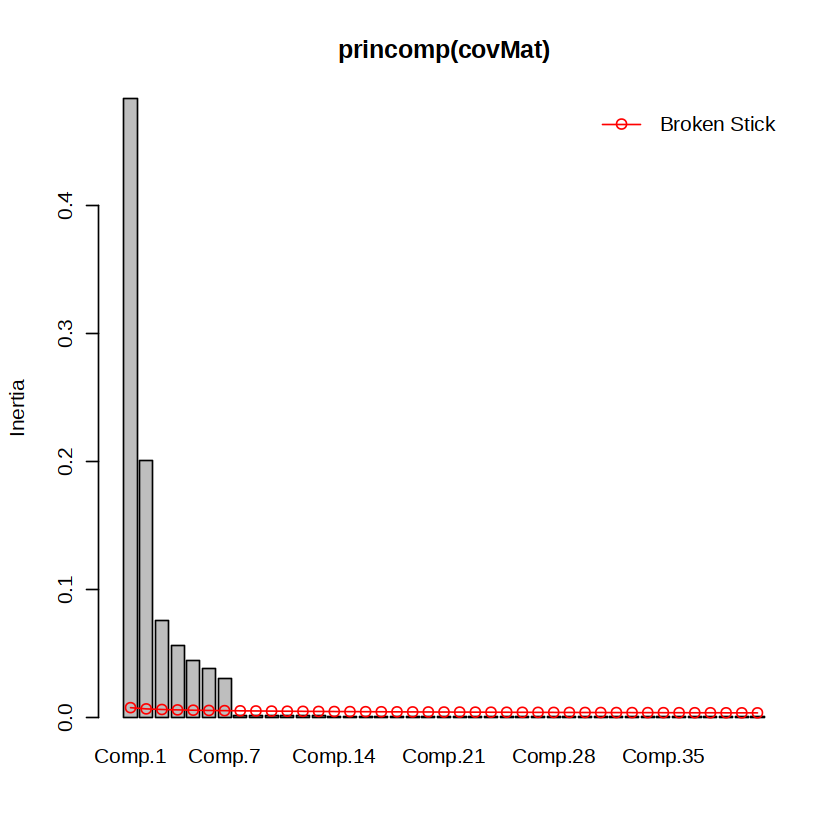

In [8]:
# Load covariance matrix
#covMat_path <- paste0(results_prefix, 'population_structure//pcangsd/allSamples/pcangsd_withoutRelated/allSamples_4fold_maf0.05_pcangsd.cov')
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/allSamples/pcangsd_withoutRelated/allSamples_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., global_order_detail)
screeplot(princomp(covMat), bstick = TRUE, npcs=41)


In [9]:
# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.6952056,0.4477291,0.27480906,0.23690243,0.21130037,0.19595686,0.17431116,0.0429893949
Proportion of Variance,0.2574646,0.1067878,0.04023028,0.02989716,0.02378436,0.02045559,0.01618607,0.0009844953
Cumulative Proportion,0.2574646,0.3642524,0.40448268,0.43437985,0.45816421,0.47861979,0.49480586,0.4957903533


### PCA plots

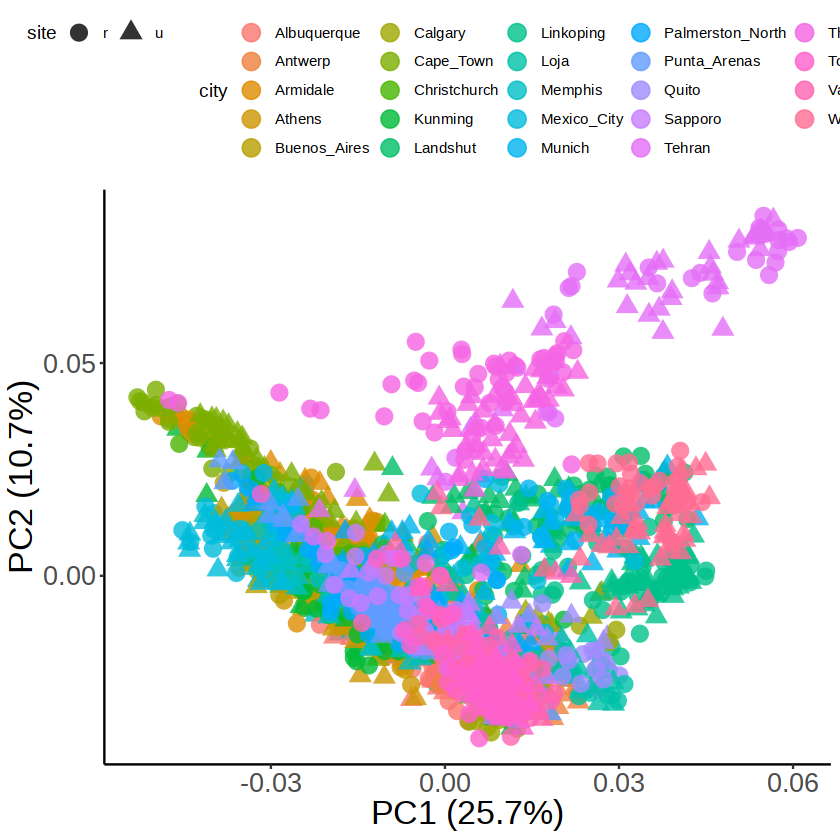

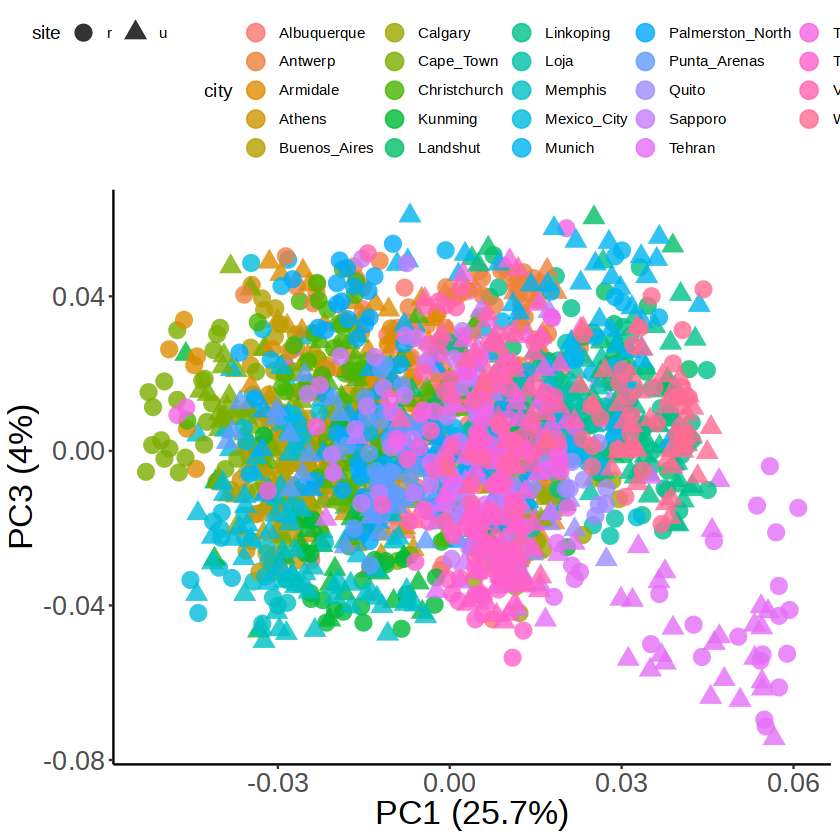

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


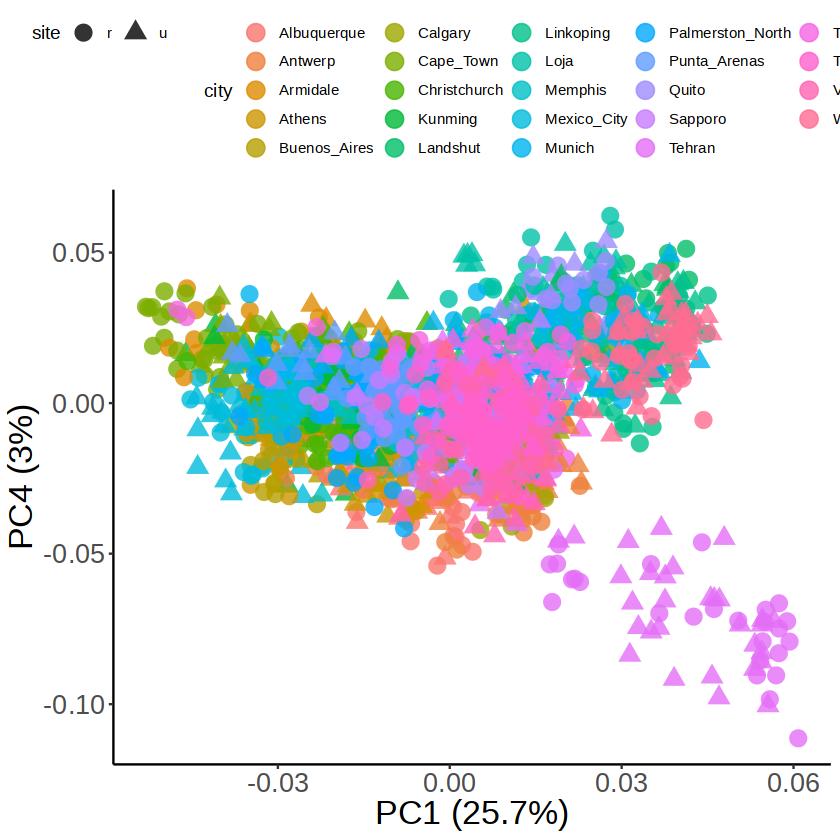

In [8]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        #stat_ellipse() +
        xlab('PC1 (25.7%)') + ylab('PC2 (10.7%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot1

pca_plot2 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC3, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        xlab('PC1 (25.7%)') + ylab('PC3 (4%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot2

pca_plot3 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC4, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        xlab('PC1 (25.7%)') + ylab('PC4 (3%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot3

ggsave(
  "Global_PCA_PC1_PC2.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)
#display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC2.png")

ggsave(
  "Global_PCA_PC1_PC3.png",
  plot = pca_plot2,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)
#display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC3.png")

ggsave(
  "Global_PCA_PC1_PC4.png",
  plot = pca_plot3,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)
#display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC4.png")


## Plot centroids PCA

In [11]:
euc_dist_df_forPlot <- eigen_df %>% 
    group_by(city, site) %>% 
    summarise(x = mean(PC1),
              y = mean(PC2),
             .groups = 'drop')

pca_centroids <- euc_dist_df_forPlot %>%
    mutate(site = fct_recode(site, 'Rural' = 'r', 'Urban' = 'u')) %>%
    ggplot(., aes(x = x, y = y, fill = site, shape = site)) +
    geom_line(size = 0.5, alpha = 0.4, aes(group = city)) +
    geom_point(size = 3.5) +
    scale_fill_manual(values = rev(cols), labels = c('Rural', 'Urban')) +
    scale_shape_manual(values = c(21, 24), labels = c('Rural', 'Urban')) +
    #scale_x_continuous(breaks = seq(from = -0.08, to = 0.06, by = 0.02)) +
    #scale_y_continuous(breaks = seq(from = -0.05, to = 0.15, by = 0.03)) +
    ylab('PC2 (10.7%)') + xlab("PC1 (25.7%)") + 
    geom_label_repel(data = . %>% filter(site == 'Rural'),
                     aes(label = city),
                        color = 'black',
                        fill = 'white', 
                        size = 5,
                        arrow = arrow(length = unit(0.03, "npc"), 
                        type = "closed", ends = "last"),
                        segment.size  = 0.3)+
    theme(panel.background = element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border=element_blank(),
            axis.line.x = element_line(color="black",size=1),
            axis.line.y = element_line(color="black",size=1),
            axis.ticks=element_line(size = 1, color="black"),
            axis.ticks.length=unit(0.25, 'cm'),
            axis.text=element_text(color="black",size=15),
            axis.title=element_text(color="black",size=1),
            axis.title.y=element_text(vjust=2,size=17),
            axis.title.x=element_text(vjust=0.1,size=17),
            axis.text.x=element_text(size=15),
            axis.text.y=element_text(size=15),
            strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
            strip.background = element_rect(colour="black"),
            legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
            legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"),
            legend.position = "right",
            legend.direction="vertical",
            legend.box.background = element_rect(colour = "black",size=1))

ggsave(
  "Centroid_PCA.svg",
  plot = pca_centroids,
  device = svg,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  width = 10, height = 8, units = 'in', dpi = 600
)
#display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_PCA.png")


In [18]:
euc_dist_df_forPlot <- eigen_df %>% 
    group_by(city, site) %>% 
    summarise(x = mean(PC1),
              y = mean(PC2),
              z = mean(PC3),
             .groups = 'drop')
head(euc_dist_df_forPlot)
write_delim(euc_dist_df_forPlot, '../analyses/tables/pca/PCA_centroid_coord.txt', delim = '\t')


city,site,x,y,z
<chr>,<chr>,<dbl>,<dbl>,<dbl>
Albuquerque,r,-0.002479057,-0.018617764,0.010600958
Albuquerque,u,-0.007600065,-0.014489331,0.002917135
Antwerp,r,0.002897882,-0.017014495,0.031717579
Antwerp,u,0.011646530,-0.018914420,0.014976153
Armidale,r,-0.018339202,0.010482423,0.012606141
Armidale,u,-0.016758646,0.009631097,0.019162541


Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


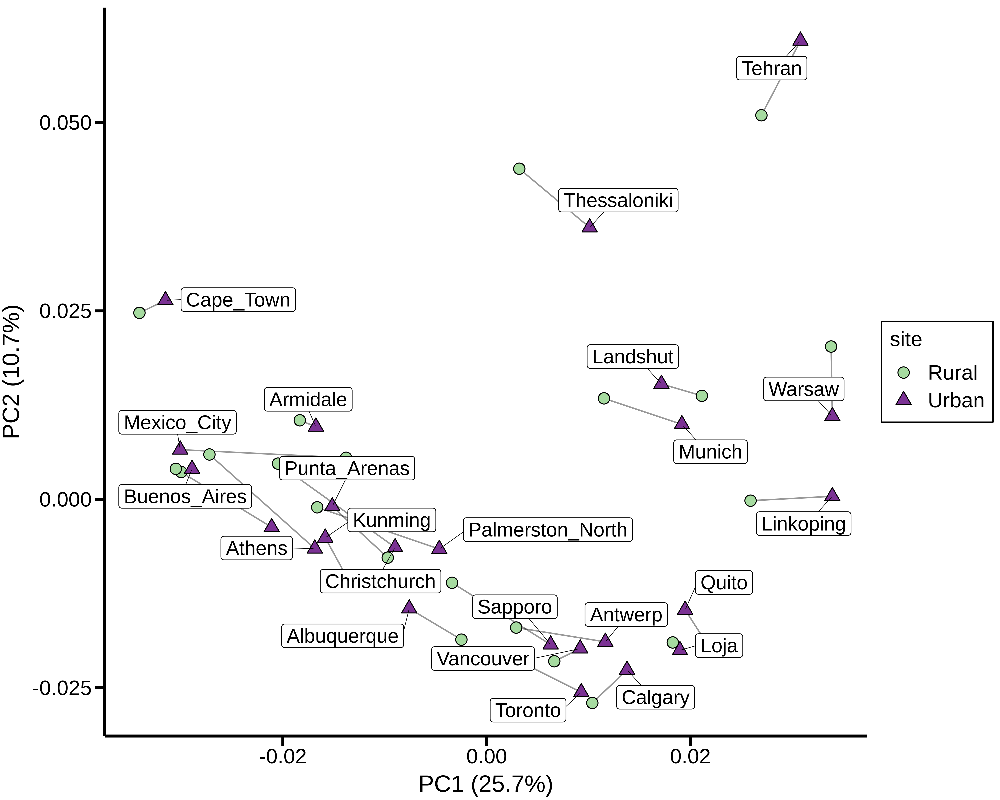

In [16]:
euc_dist_df_forPlot <- eigen_df %>% 
    group_by(city, site) %>% 
    summarise(x = mean(PC1),
              y = mean(PC2),
             .groups = 'drop')

pca_centroids <- euc_dist_df_forPlot %>%
    mutate(site = fct_recode(site, 'Rural' = 'r', 'Urban' = 'u')) %>%
    ggplot(., aes(x = x, y = y, fill = site, shape = site)) +
    geom_line(size = 0.5, alpha = 0.4, aes(group = city)) +
    geom_point(size = 4.5) +
    scale_fill_manual(values = rev(cols), labels = c('Rural', 'Urban')) +
    scale_shape_manual(values = c(21, 24), labels = c('Rural', 'Urban')) +
    #scale_x_continuous(breaks = seq(from = -0.08, to = 0.06, by = 0.02)) +
    #scale_y_continuous(breaks = seq(from = -0.05, to = 0.15, by = 0.03)) +
    ylab('PC2 (10.7%)') + xlab("PC1 (25.7%)") + 
    geom_label_repel(data = . %>% filter(site == 'Urban', city != "Memphis"),
                     aes(label = city),
                        color = 'black',
                        min.segment.length = 0.3, seed = 42, box.padding = 0.7,
                        #position = position_dodge(0.5),
                        fill = 'white', 
                        size = 7,
                        #arrow = arrow(length = unit(0.0001, "npc"), type = "closed", ends = "last"),
                        segment.size  = 0.2)+
    theme(panel.background = element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border=element_blank(),
            axis.line.x = element_line(color="black",size=1),
            axis.line.y = element_line(color="black",size=1),
            axis.ticks=element_line(size = 1, color="black"),
            axis.ticks.length=unit(0.25, 'cm'),
            axis.text=element_text(color="black",size=15),
            axis.title=element_text(color="black",size=1),
            axis.title.y=element_text(vjust=2,size=17),
            axis.title.x=element_text(vjust=0.1,size=17),
            axis.text.x=element_text(size=15),
            axis.text.y=element_text(size=15),
            strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
            strip.background = element_rect(colour="black"),
            legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
            legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"),
            legend.position = "right",
            legend.direction="vertical",
            legend.box.background = element_rect(colour = "black",size=1))

ggsave(
  "Centroid_PCA_small2.svg",
  plot = pca_centroids,
  device = svg,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  width = 10, height = 8, units = 'in', dpi = 600
)
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_PCA_small.png")


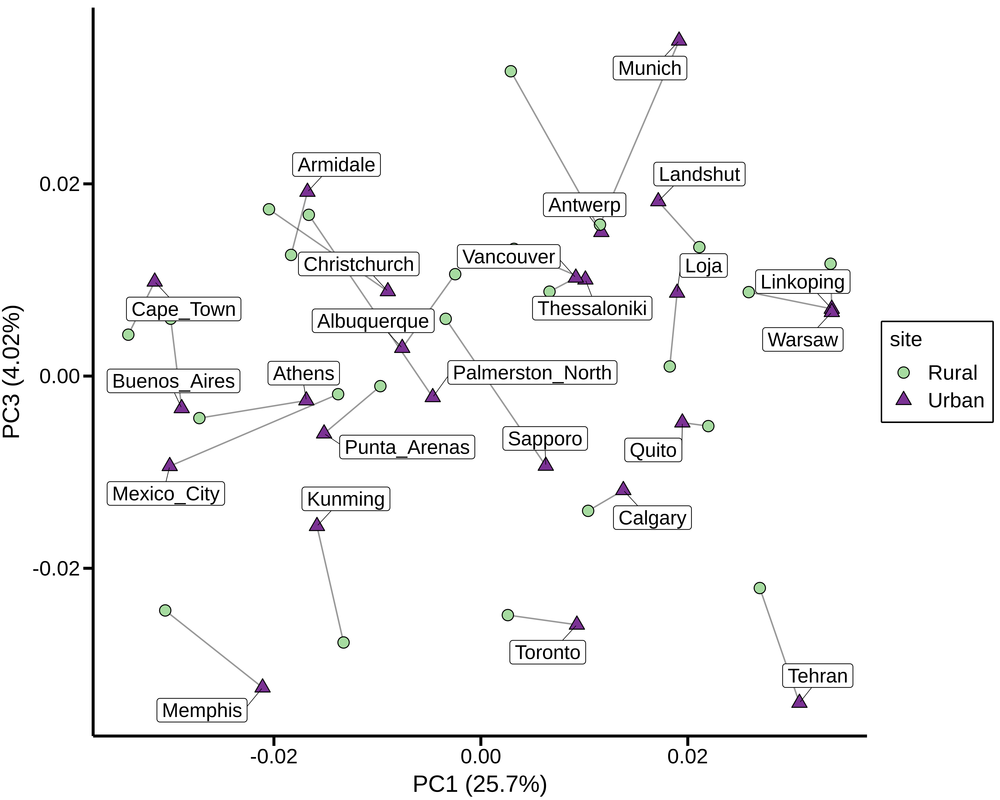

In [17]:
euc_dist_df_forPlot <- eigen_df %>% 
    group_by(city, site) %>% 
    summarise(x = mean(PC1),
              y = mean(PC3),
             .groups = 'drop')

pca_centroids <- euc_dist_df_forPlot %>%
    mutate(site = fct_recode(site, 'Rural' = 'r', 'Urban' = 'u')) %>%
    ggplot(., aes(x = x, y = y, fill = site, shape = site)) +
    geom_line(size = 0.5, alpha = 0.4, aes(group = city)) +
    geom_point(size = 4.5) +
    scale_fill_manual(values = rev(cols), labels = c('Rural', 'Urban')) +
    scale_shape_manual(values = c(21, 24), labels = c('Rural', 'Urban')) +
    #scale_x_continuous(breaks = seq(from = -0.08, to = 0.06, by = 0.02)) +
    #scale_y_continuous(breaks = seq(from = -0.05, to = 0.15, by = 0.03)) +
    ylab('PC3 (4.02%)') + xlab("PC1 (25.7%)") + 
    geom_label_repel(data = . %>% filter(site == 'Urban'),
                     aes(label = city),
                        color = 'black',
                        min.segment.length = 0.3, seed = 42, box.padding = 0.7,
                        #position = position_dodge(0.5),
                        fill = 'white', 
                        size = 7,
                        #arrow = arrow(length = unit(0.0001, "npc"), type = "closed", ends = "last"),
                        segment.size  = 0.2)+
    theme(panel.background = element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border=element_blank(),
            axis.line.x = element_line(color="black",size=1),
            axis.line.y = element_line(color="black",size=1),
            axis.ticks=element_line(size = 1, color="black"),
            axis.ticks.length=unit(0.25, 'cm'),
            axis.text=element_text(color="black",size=15),
            axis.title=element_text(color="black",size=1),
            axis.title.y=element_text(vjust=2,size=17),
            axis.title.x=element_text(vjust=0.1,size=17),
            axis.text.x=element_text(size=15),
            axis.text.y=element_text(size=15),
            strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
            strip.background = element_rect(colour="black"),
            legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
            legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"),
            legend.position = "right",
            legend.direction="vertical",
            legend.box.background = element_rect(colour = "black",size=1))

ggsave(
  "Centroid_PCA_PC3_small2.svg",
  plot = pca_centroids,
  device = svg,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  width = 10, height = 8, units = 'in', dpi = 600
)
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_PCA_PC3_small.png")


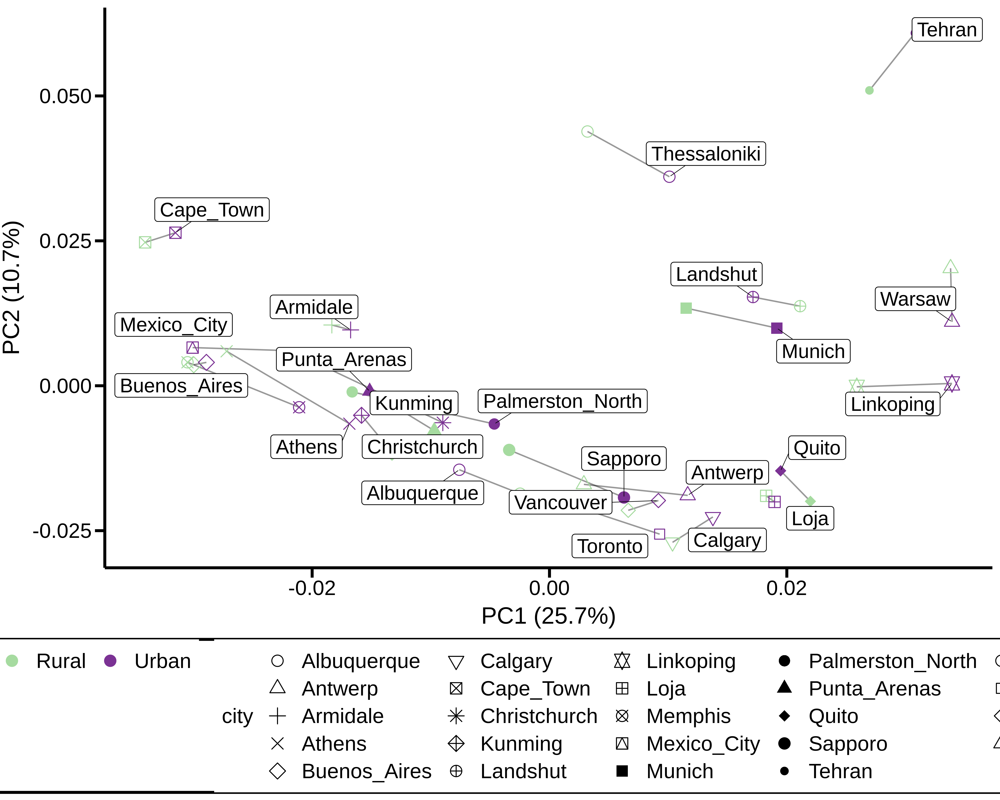

In [25]:
urban_col <- "#7b3294"
rural_col <- "#a6dba0"
cols <- c(urban_col, rural_col)

euc_dist_df_forPlot <- eigen_df %>% 
    group_by(city, site) %>% 
    summarise(x = mean(PC1),
              y = mean(PC2),
             .groups = 'drop')

pca_centroids <- euc_dist_df_forPlot %>%
    mutate(site = fct_recode(site, 'Rural' = 'r', 'Urban' = 'u')) %>%
    ggplot(., aes(x = x, y = y, color = site, shape = city)) +
    geom_line(size = 0.5, color="black", alpha = 0.4, aes(group = city)) +
    geom_point(size = 3.5) +
    scale_color_manual(values = rev(cols), labels = c('Rural', 'Urban')) +
    scale_shape_manual(values = c(1:24)) +
    #scale_x_continuous(breaks = seq(from = -0.08, to = 0.06, by = 0.02)) +
    #scale_y_continuous(breaks = seq(from = -0.05, to = 0.15, by = 0.03)) +
    ylab('PC2 (10.7%)') + xlab("PC1 (25.7%)") + 
    geom_label_repel(data = . %>% filter(site == 'Urban', city != "Memphis"),
                     aes(label = city),
                        color = 'black',
                        min.segment.length = 0.8, seed = 2, box.padding = 0.5,
                        #position = position_dodge(0.5),
                        fill = 'white', 
                        size = 5,
                        #arrow = arrow(length = unit(0.0001, "npc"), type = "closed", ends = "last"),
                        segment.size  = 0.2)+
    theme(panel.background = element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border=element_blank(),
            axis.line.x = element_line(color="black",size=1),
            axis.line.y = element_line(color="black",size=1),
            axis.ticks=element_line(size = 1, color="black"),
            axis.ticks.length=unit(0.25, 'cm'),
            axis.text=element_text(color="black",size=15),
            axis.title=element_text(color="black",size=1),
            axis.title.y=element_text(vjust=2,size=17),
            axis.title.x=element_text(vjust=0.1,size=17),
            axis.text.x=element_text(size=15),
            axis.text.y=element_text(size=15),
            strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
            strip.background = element_rect(colour="black"),
            legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
            legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"),
            legend.position = "bottom",
            legend.direction="horizontal",
            legend.box.background = element_rect(colour = "black",size=1))
ggsave(
  "Centroid_PCA_points.png",
  plot = pca_centroids,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  width = 10, height = 8, units = 'in', dpi = 600
)
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_PCA_points.png")


## Uniform Manifold Approximation Projection (UMAP)

Saving 6.67 x 6.67 in image


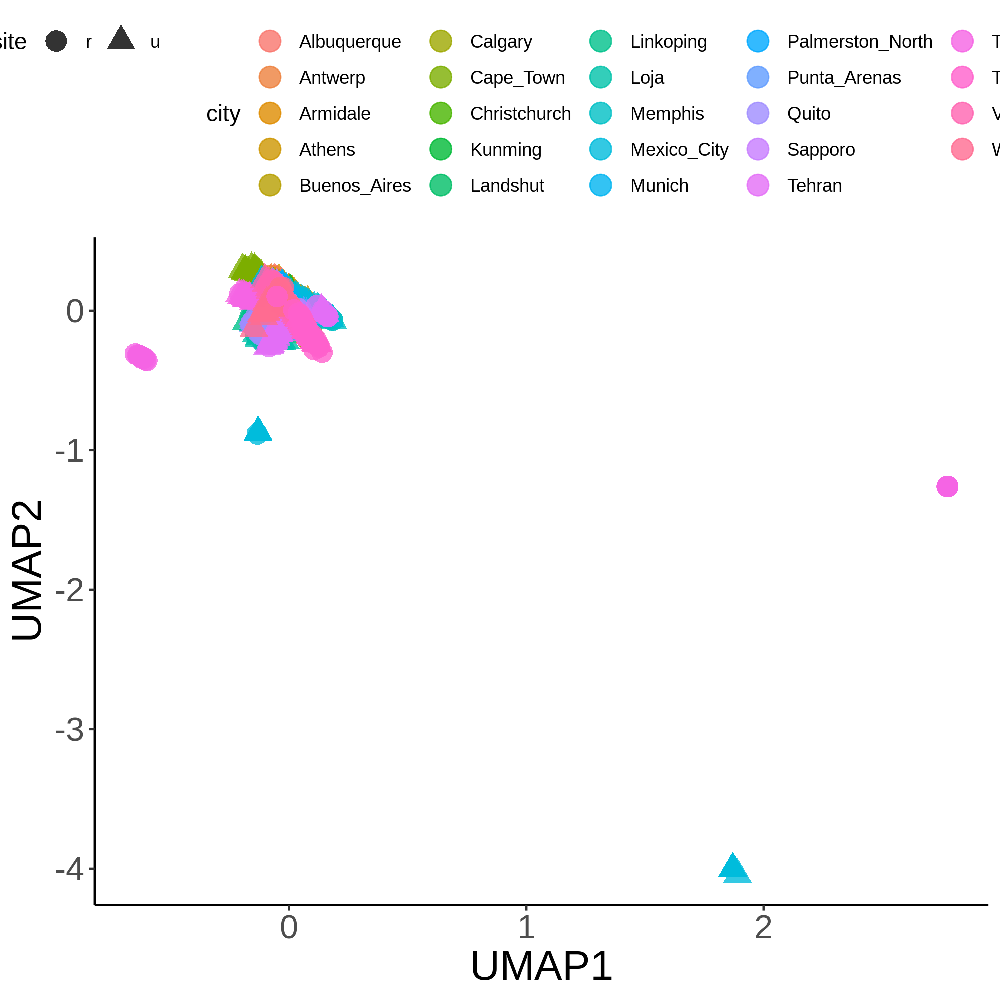

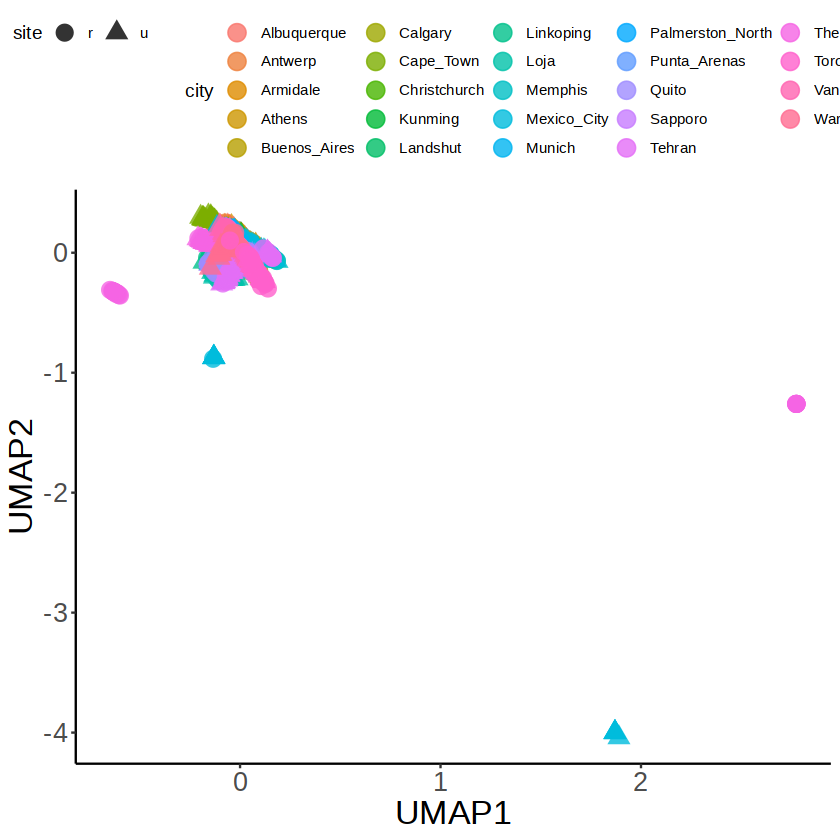

In [72]:
distMat <- as.matrix(dist(covMat))
global_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
global_umap_layout <- global_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., global_order_detail)
umap_plot <- global_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
umap_plot

ggsave(
  "Global_UMAP_UMAP1_UMAP2.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Global_UMAP_UMAP1_UMAP2.png"
display_png(file=path_to_kplot)

Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


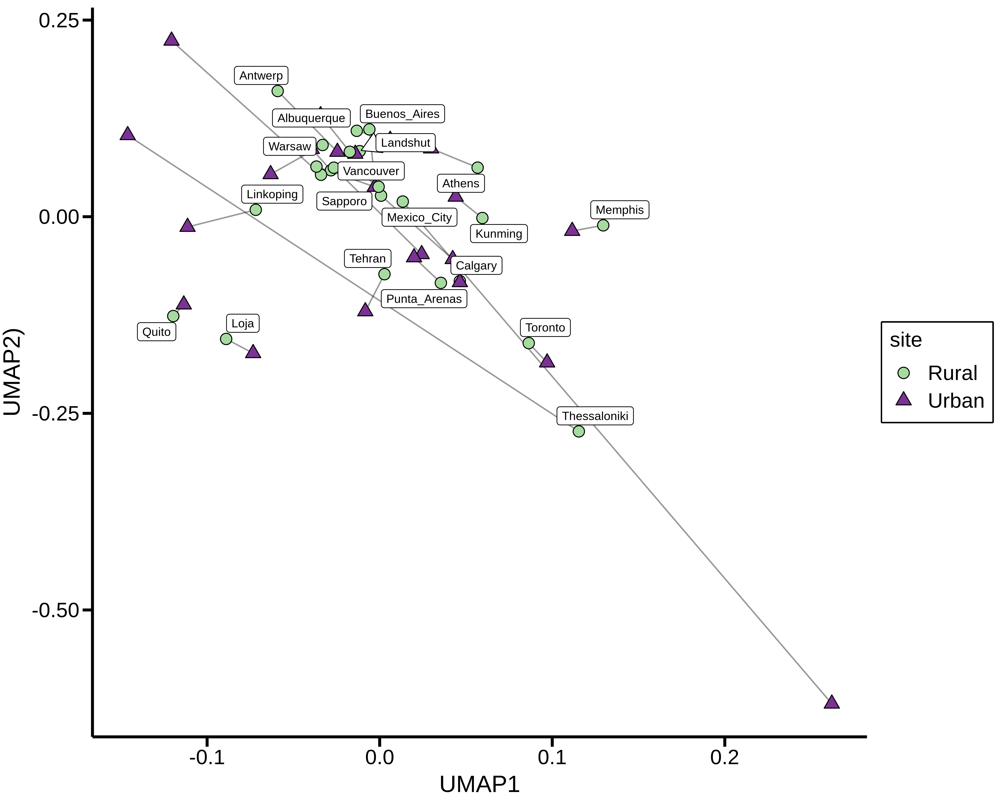

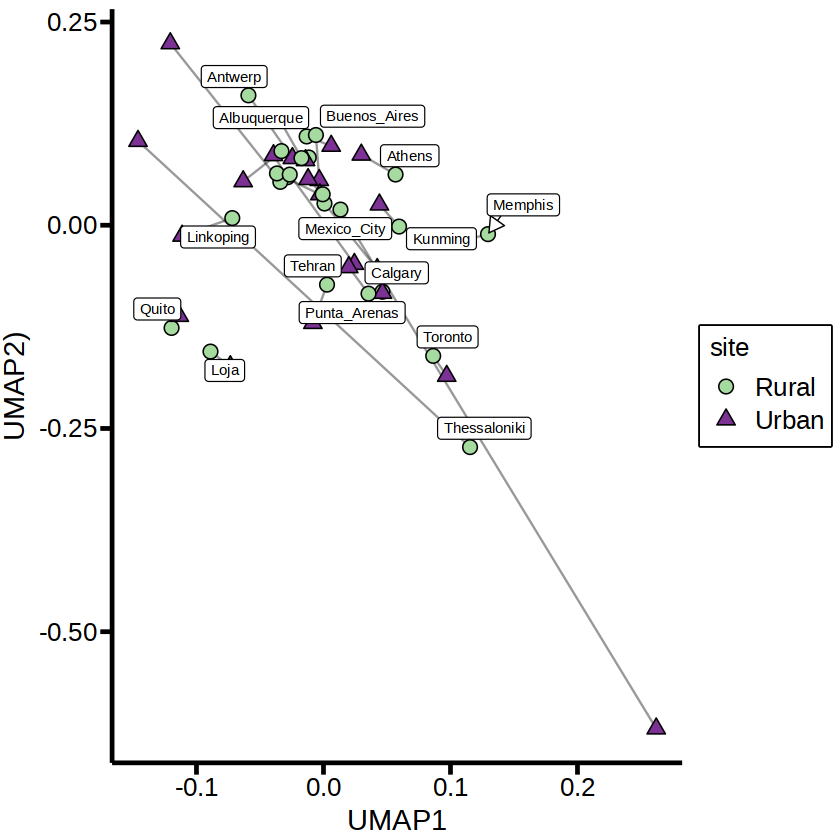

In [75]:
umap_centroids_df_forPlot <- global_umap_layout %>% 
    group_by(city, site) %>% 
    summarise(x = mean(V1),
              y = mean(V2),
             .groups = 'drop')

umap_centroids <- umap_centroids_df_forPlot %>%
    mutate(site = fct_recode(site, 'Rural' = 'r', 'Urban' = 'u')) %>%
    ggplot(., aes(x = x, y = y, fill = site, shape = site)) +
    geom_line(size = 0.5, alpha = 0.4, aes(group = city)) +
    geom_point(size = 3.5) +
    scale_fill_manual(values = rev(cols), labels = c('Rural', 'Urban')) +
    scale_shape_manual(values = c(21, 24), labels = c('Rural', 'Urban')) +
    #scale_x_continuous(breaks = seq(from = -0.08, to = 0.06, by = 0.02)) +
    #scale_y_continuous(breaks = seq(from = -0.05, to = 0.15, by = 0.03)) +
    ylab('UMAP2)') + xlab("UMAP1") + 
    geom_label_repel(data = . %>% filter(site == 'Rural'),
                     aes(label = city),
                        color = 'black',
                        fill = 'white', 
                        size = 3,
                        arrow = arrow(length = unit(0.03, "npc"), 
                        type = "closed", ends = "last"),
                        segment.size  = 0.3)+
    theme(panel.background = element_blank(),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border=element_blank(),
            axis.line.x = element_line(color="black",size=1),
            axis.line.y = element_line(color="black",size=1),
            axis.ticks=element_line(size = 1, color="black"),
            axis.ticks.length=unit(0.25, 'cm'),
            axis.text=element_text(color="black",size=15),
            axis.title=element_text(color="black",size=1),
            axis.title.y=element_text(vjust=2,size=17),
            axis.title.x=element_text(vjust=0.1,size=17),
            axis.text.x=element_text(size=15),
            axis.text.y=element_text(size=15),
            strip.text.x = element_text(size = 15, colour = "black",face = "bold"),
            strip.background = element_rect(colour="black"),
            legend.text=element_text(size=15), legend.key = element_rect(fill = "white"),
            legend.title = element_text(size=15),legend.key.size = unit(0.7, "cm"),
            legend.position = "right",
            legend.direction="vertical",
            legend.box.background = element_rect(colour = "black",size=1))

ggsave(
  "Centroid_UMAP.png",
  plot = umap_centroids,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  width = 10, height = 8, units = 'in', dpi = 600
)
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_UMAP.png")


In [198]:
# What are those outlier cluster?
global_umap_layout %>% filter((V1 > -0.2 & V2 < -0.2) | ( V1 < 0.18 & V2 > 0.2))

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V40,sample,continent,city,pop,individual,site,range,library,lane
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>
-0.09536316,-0.4502377,-0.03574123,0.06145425,0.20297772,0.3478256,-0.2825943,-0.5916182,0.2987808,-0.0264454158,⋯,1.0068069,Loja_1_19,SAM,Loja,1,19,r,Introduced,glue_low1,1
-0.06301646,-0.5558888,-0.12443472,0.02882191,0.23754922,0.2913130,-0.2540111,-0.6241545,0.3088860,0.0006979202,⋯,1.1558630,Loja_1_7,SAM,Loja,1,7,r,Introduced,glue_low1,1
-0.06806414,-0.4497867,-0.04690693,0.05212988,0.19806631,0.3682953,-0.2782002,-0.5950878,0.2775639,-0.0011949219,⋯,1.0045068,Loja_2_10,SAM,Loja,2,10,r,Introduced,glue_low1,1
-0.06146955,-0.5186872,-0.09756762,0.03793338,0.22302784,0.3218814,-0.2604353,-0.6154038,0.2983395,0.0069776586,⋯,1.1016239,Loja_2_20,SAM,Loja,2,20,r,Introduced,glue_low1,1
-0.09617653,-0.4588752,-0.04915797,0.06481921,0.21389917,0.3435115,-0.2744077,-0.5953664,0.3044918,-0.0162691598,⋯,1.0078452,Loja_3_5,SAM,Loja,3,5,r,Introduced,glue_low1,1
-0.07443298,-0.5602830,-0.10170971,0.03467852,0.22814455,0.2878509,-0.2489954,-0.6235629,0.3328727,-0.0092769640,⋯,1.2369165,Loja_3_4,SAM,Loja,3,4,r,Introduced,glue_low1,1
-0.05355014,-0.4029363,0.06054697,0.01036010,0.10028002,0.3545853,-0.3187759,-0.5483054,0.2834132,-0.0995986658,⋯,1.1255929,Loja_3_2,SAM,Loja,3,2,r,Introduced,glue_low1,1
-0.07113956,-0.3801935,0.08517623,0.02074835,0.09540268,0.3611497,-0.3308823,-0.5429359,0.2823080,-0.1163258713,⋯,1.0878208,Loja_2_7,SAM,Loja,2,7,r,Introduced,glue_low1,1
-0.06317912,-0.4810242,-0.07906127,0.04859755,0.21573637,0.3543591,-0.2697836,-0.6099354,0.2799904,0.0147670318,⋯,1.0262017,Loja_2_6,SAM,Loja,2,6,r,Introduced,glue_low1,1


# PCA and UMAP by city

## Figure automatization 

### PCA

In [7]:
# File of samples order per city
list<-c("Albuquerque", "Antwerp", "Armidale","Athens","Buenos_Aires",
        "Calgary","Cape_Town","Christchurch","Kunming","Landshut","Linkoping","Loja","Memphis",
        "Mexico_City","Munich","Palmerston_North","Punta_Arenas","Quito","Sapporo","Tehran",
        "Thessaloniki","Toronto","Vancouver","Warsaw")
samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")

for (city in list){
    samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")
    detail <- read.table(paste0("/scratch/projects/trifolium/glue/demography/glue_demography/results/program_resources/bam_lists/by_city/withoutRelated/",city,"/",city,"_4fold_lowCovRemoved_bams.list"))
    head(detail)
    detail$V1<-gsub("/scratch/projects/trifolium/glue/pc/results/bam/4fold/","",as.character(detail$V1))
    detail$V1<-gsub("_4fold.bam","",as.character(detail$V1))
    name <-paste0(city,'_order_detail')
    tmp <-merge(samples, detail,  by.x="sample", by.y="V1", all.x=FALSE, all.y=TRUE, sort=FALSE) 
    assign(name,tmp)
    }

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


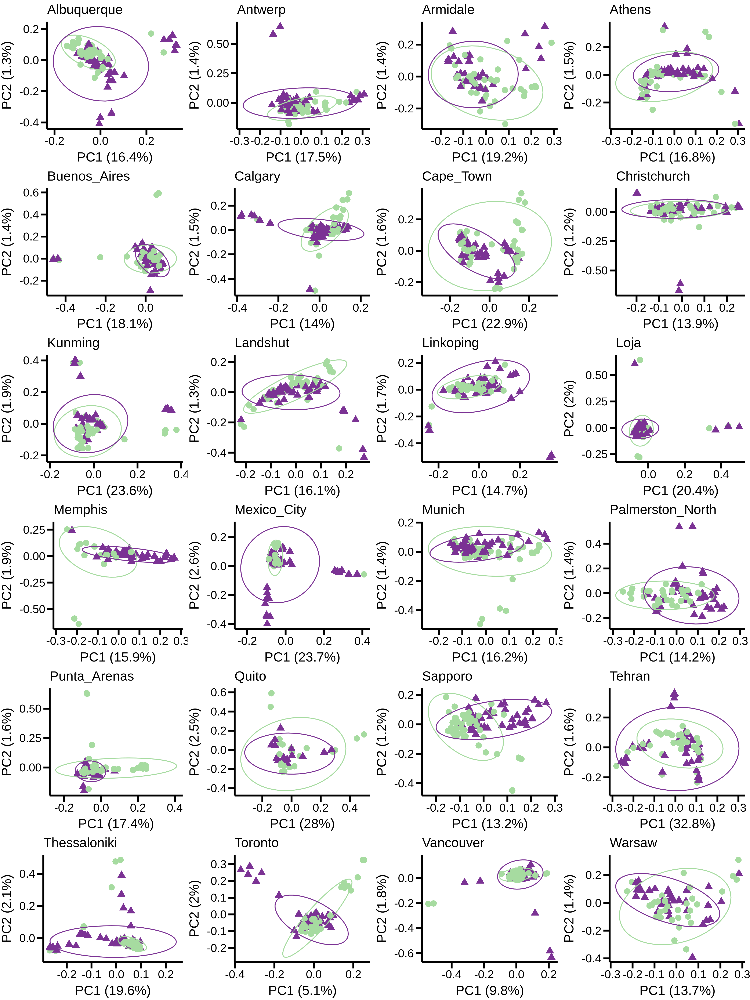

In [36]:
list<-c("Albuquerque", "Antwerp", "Armidale","Athens","Buenos_Aires",
        "Calgary","Cape_Town","Christchurch","Kunming","Landshut","Linkoping","Loja","Memphis",
        "Mexico_City","Munich","Palmerston_North","Punta_Arenas","Quito","Sapporo","Tehran",
        "Thessaloniki","Toronto","Vancouver","Warsaw")

columns<- c("city","habitat","area","var_explained1","var_explained2","continent","range") 
table_area<- data.frame(matrix(nrow = 0, ncol = length(columns))) 
colnames(table_area) = columns

columns2<- c("city","overlap","var_explained1","var_explained2","continent","range") 
table_overlap<- data.frame(matrix(nrow = 0, ncol = length(columns2))) 
colnames(table_overlap) = columns2

for (city in list){
    covMat<-as.matrix(read.table(paste0("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure/pcangsd/by_city/pcangsd_withoutRelated/",city,"/",city,"_4fold_maf0.05_pcangsd.cov")))
    # Perform eigen decomposition of covariance matrix
    # Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
    eigenvectors <- eigen(covMat)
    eigen_df <- eigenvectors$vectors %>%
            as.data.frame() %>%
            dplyr::select(V1, V2, V3, V4) %>%
            rename('PC1' = 'V1',
                   'PC2' = 'V2',
                   'PC3' = 'V3',
                   'PC4' = 'V4') %>%
        bind_cols(.,get(paste0(city,'_order_detail')))
    
    eigen_df <- eigenvectors$vectors %>%
            as.data.frame() %>%
            dplyr::select(V1, V2, V3, V4) %>%
            rename('PC1' = 'V1',
                   'PC2' = 'V2',
                   'PC3' = 'V3',
                   'PC4' = 'V4') %>%
        bind_cols(.,get(paste0(city,'_order_detail')))

    # Percent Variance explained by first 4 PCs
    summary_pca<-pca_importance(summary(princomp(covMat))) %>% 
        as.data.frame() %>% 
        rownames_to_column('var') %>% 
        dplyr::select(var, Comp.1:Comp.8)
    #screeplot(princomp(covMat), bstick = TRUE, npcs=41)
    
    # PCA plot with automated axes names and title change 
    pca_plot1 <- eigen_df %>%
        ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
            geom_point(size = 3) +
            theme_classic() +
            stat_ellipse() +
            scale_color_manual(values=c("#a6dba0", "#7b3294")) +
            ggtitle(paste0(city))+
            xlab(paste0('PC1 (',round(100*summary_pca[2,2],1),'%)')) + ylab(paste0('PC2 (',round(100*summary_pca[2,3],1),'%)')) +
            theme(panel.background = element_blank(),
                panel.grid.major = element_blank(),
                panel.grid.minor = element_blank(),
                panel.border=element_blank(),
                axis.line.x = element_line(color="black",size=1),
                axis.line.y = element_line(color="black",size=1),
                axis.ticks=element_line(size = 1, color="black"),
                axis.ticks.length=unit(0.25, 'cm'),
                axis.text=element_text(color="black",size=13),
                axis.title=element_text(color="black",size=1),
                axis.title.y=element_text(vjust=2,size=15),
                axis.title.x=element_text(vjust=0.1,size=15),
                axis.text.x=element_text(size=13),
                axis.text.y=element_text(size=13),
                strip.text.x = element_text(size = 13, colour = "black",face = "bold"),
                strip.background = element_rect(colour="black"),
                legend.position = 'none',
                plot.title = element_text(size=15))
    #print(pca_plot1)
    name <-paste0(city,'_plot')
    assign(name,pca_plot1)
    
    # Ellipse area and overlap
    eigen_df2<-eigen_df[,c(1,2,10,7)]
    colnames(eigen_df2)<-c("iso1", "iso2", "group", "community")
    siber_data<-createSiberObject(eigen_df2)
    group.ellipses.args  <- list(n = 100, p.interval = NULL, lty = 1, lwd = 2)
    ellipse1 <- paste0(city,".r")
    ellipse2 <- paste0(city,".u")
    areas <- maxLikOverlap(ellipse1, ellipse2, siber_data, 
                             p.interval = NULL, n = 100)
    prop.95.over <- areas[3] / (areas[2] + areas[1] -areas[3])    
    table_area[nrow(table_area) + 1,] = c(city,"r",areas[1],summary_pca[2,2],summary_pca[2,3],get(paste0(city,'_order_detail'))[1,2],get(paste0(city,'_order_detail'))[1,7])
    table_area[nrow(table_area) + 1,] = c(city,"u",areas[2],summary_pca[2,2],summary_pca[2,3],get(paste0(city,'_order_detail'))[1,2],get(paste0(city,'_order_detail'))[1,7])
    #print(table_area)
    table_overlap[nrow(table_overlap) + 1,] = c(city,prop.95.over,summary_pca[2,2],summary_pca[2,3],get(paste0(city,'_order_detail'))[1,2],get(paste0(city,'_order_detail'))[1,7])
    #print(table_overlap)
    
    #ggsave(
    #  filename=paste0(city,"_PCA.png"),
    #  plot = pca_plot1,
    #  device = png,
    #  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
    #  dpi = 300
    #)
    }

#write_csv(table_area, '../analyses/tables/pca_ellipse_areas.csv')
#write_csv(table_overlap, '../analyses/tables/pca_ellipse_overlap.csv')

pca_combined1<-ggarrange(Albuquerque_plot,Antwerp_plot,Armidale_plot,Athens_plot,
                       Buenos_Aires_plot,Calgary_plot,Cape_Town_plot,Christchurch_plot,
                       Kunming_plot,Landshut_plot,Linkoping_plot,Loja_plot,
                       ncol=3,nrow=4)

pca_combined2<-ggarrange(Memphis_plot,Mexico_City_plot,Munich_plot,Palmerston_North_plot,
                       Punta_Arenas_plot,Quito_plot,Sapporo_plot,Tehran_plot,
                       Thessaloniki_plot,Toronto_plot,Vancouver_plot,Warsaw_plot,
                       ncol=3,nrow=4)

#ggsave(
#    "pca_pannel1.png",
#    plot= pca_combined1,
#    device = png,
#    path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
#    width = 30,
#    height = 40,
#    units = "cm",
#    dpi = 300
#    )
#path_to_pca1<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/pca_pannel1.png"
#display_png(file=path_to_pca1)

#ggsave(
#    "pca_pannel2.png",
#    plot= pca_combined1,
#    device = png,
#    path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
#    width = 30,
#    height = 40,
#    units = "cm",
#    dpi = 300
#    )
#path_to_pca1<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/pca_pannel2.png"
#display_png(file=path_to_pca1)

pca_combined1<-ggarrange(Albuquerque_plot,Antwerp_plot,Armidale_plot,Athens_plot,
                       Buenos_Aires_plot,Calgary_plot,Cape_Town_plot,Christchurch_plot,
                       Kunming_plot,Landshut_plot,Linkoping_plot,Loja_plot,
                       Memphis_plot,Mexico_City_plot,Munich_plot,Palmerston_North_plot,
                       Punta_Arenas_plot,Quito_plot,Sapporo_plot,Tehran_plot,
                       Thessaloniki_plot,Toronto_plot,Vancouver_plot,Warsaw_plot,
                       ncol=4,nrow=6)

ggsave(
    "pca_pannel_tot.png",
    plot= pca_combined1,
    device = png,
    path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
    width = 30,
    height = 40,
    units = "cm",
    dpi = 300
    )
path_to_pca1<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/pca_pannel_tot.png"
display_png(file=path_to_pca1)


### UMAP

In [19]:
for (city in list){
    distMat <- as.matrix(dist(covMat))
    object_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
    object_umap_layout <- object_umap$layout %>% 
        as_tibble() %>% 
        bind_cols(., get(paste0(city,'_order_detail')))
    
    umap_plot <- object_umap_layout %>%
        ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
            geom_point(size = 4.5, alpha = 0.8) +
            theme_classic() +
            ggtitle(paste0(city, " UMAP"))+
            stat_ellipse() +
            scale_color_manual(values=c("yellowgreen", "grey14")) +
            xlab('UMAP1') + ylab('UMAP2') +
            theme(axis.text = element_text(size = 16),
                  axis.title = element_text(size = 20),
                  title = element_text(size=24),
                  legend.position = 'top')
    umap_plot

    ggsave(
      filename=paste0(city,"_UMAP.png"),
      plot = umap_plot,
      device = png,
      path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
      dpi = 300
    )
    }



ERROR: [1m[33mError[39m in `bind_cols()`:[22m
[33m![39m Can't recycle `..1` (size 1976) to match `..2` (size 84).


## Ellipse size and overlap

### Model ellipse size

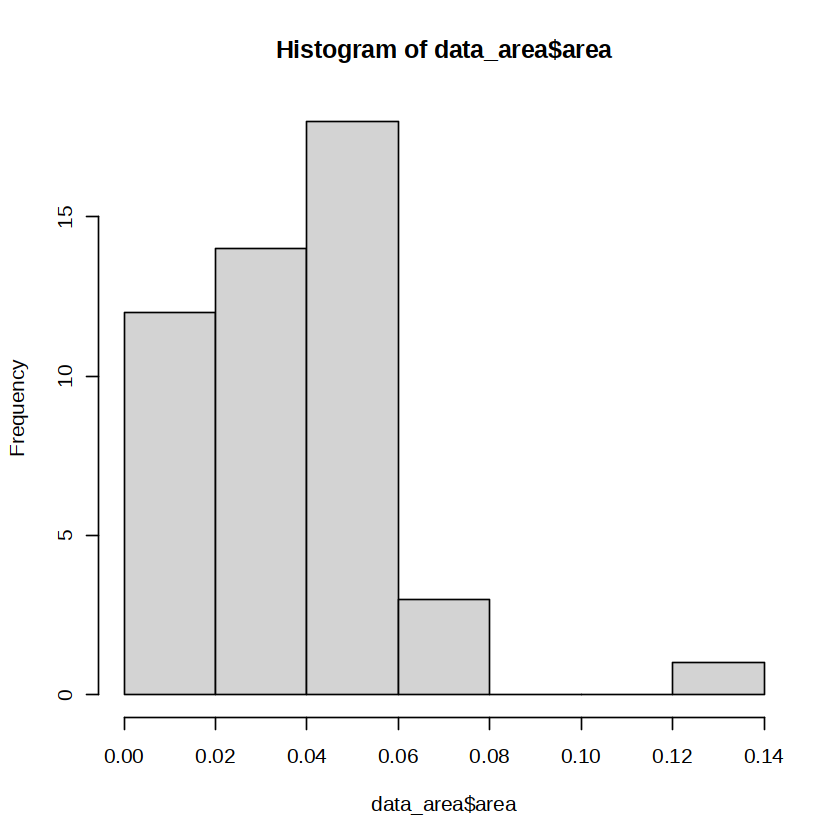

[1] 0.11959684 0.22800762 0.11067629 0.24653859 0.20260277 0.19722286
 [7] 0.21276708 0.18710921 0.24239008 0.16233434 0.15786965 0.19062778
[13] 0.23334011 0.14144425 0.11223408 0.23963155 0.20911934 0.22524706
[19] 0.16793687 0.17737616 0.11773960 0.25404861 0.24419876 0.24282215
[25] 0.24472652 0.11347795 0.13367890 0.24127942 0.22174041 0.11398800
[31] 0.12530533 0.21240579 0.25197557 0.07931746 0.35555719 0.21008214
[37] 0.16972636 0.13644982 0.16672583 0.23793673 0.17270648 0.17919471
[43] 0.10959938 0.15249563 0.10723851 0.22874830 0.22946542 0.19378940

boundary (singular) fit: see help('isSingular')

Warning message in as_lmerModLT(model, devfun):
“Model may not have converged with 1 eigenvalue close to zero: 1.6e-12”


,(Intercept),continent,habitat,range,var_explained1,var_explained2,continent:habitat,habitat:range,df,logLik,AICc,delta,weight
,<dbl>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<mdl.wght>
25,0.10601682,NA,NA,NA,0.3241574,1.4865854,NA,NA,6,71.36449,-128.68020,0.0000000,3.733107e-01
17,0.13537053,NA,NA,NA,NA,3.1941249,NA,NA,5,69.93336,-128.43816,0.2420449,3.307586e-01
9,0.12502947,NA,NA,NA,0.3557199,NA,NA,NA,5,69.42056,-127.41255,1.2676515,1.980630e-01
1,0.18800133,NA,NA,NA,NA,NA,NA,NA,4,67.18762,-125.44500,3.2352032,7.405511e-02
29,0.10952306,NA,NA,+,0.3350025,1.2811078,NA,NA,7,68.30937,-119.81875,8.8614559,4.444570e-03
21,0.13552517,NA,NA,+,NA,3.2164873,NA,NA,6,66.91948,-119.79019,8.8900166,4.381551e-03
27,0.10241977,NA,+,NA,0.3241574,1.4865854,NA,NA,7,68.21270,-119.62540,9.0548000,4.035020e-03
19,0.13176099,NA,+,NA,NA,3.1918429,NA,NA,6,66.81122,-119.57365,9.1065496,3.931954e-03
13,0.12618002,NA,NA,+,0.3642120,NA,NA,NA,6,66.39920,-118.74962,9.9305815,2.604187e-03


boundary (singular) fit: see help('isSingular')



,Sum Sq,Mean Sq,NumDF,DenDF,F value,Pr(>F)
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
habitat,0.0006210591,0.0006210591,1,44,0.2199306,0.64140824
var_explained1,0.0142124928,0.0142124928,1,44,5.0329545,0.02995315
var_explained2,0.0012221259,0.0012221259,1,44,0.4327815,0.51405452


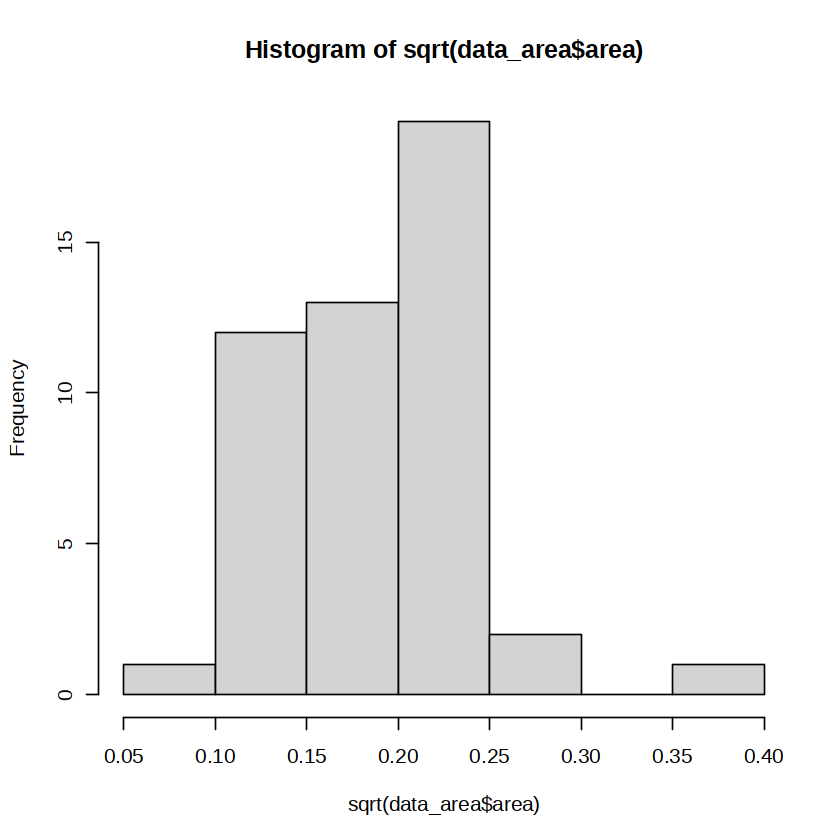

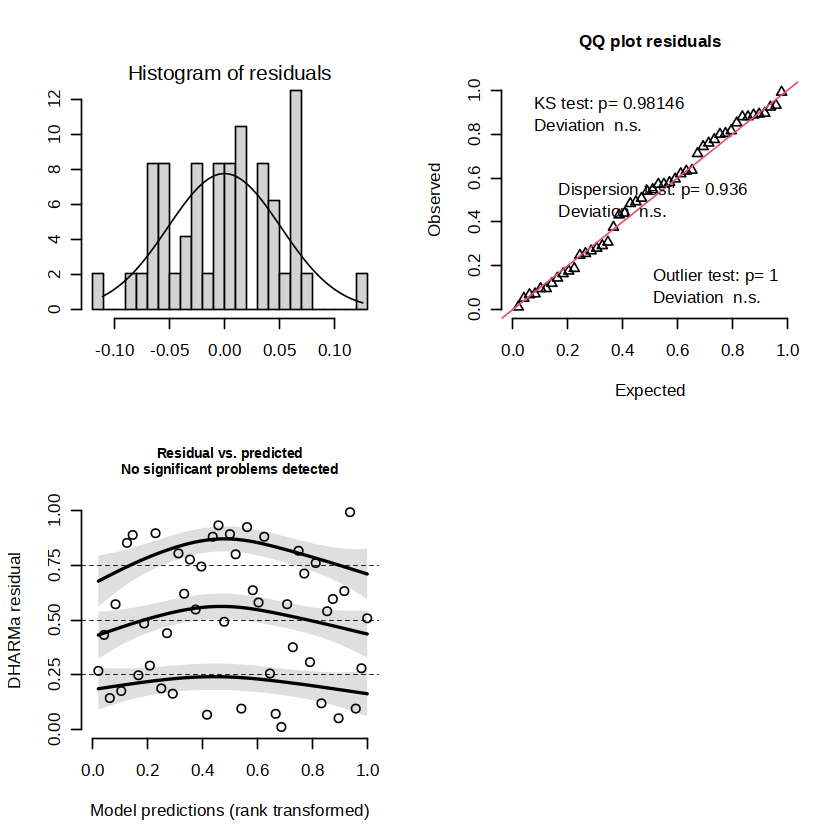

In [44]:
data_area<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses//analyses/tables/pca_ellipse_areas.csv")
#head(data_area)

hist(data_area$area)
#hist(log(data_area$area))
hist(sqrt(data_area$area))
sqrt(data_area$area)
data_area$sqrt_area<-sqrt(data_area$area)


mod_area<-lmer(sqrt_area ~ habitat+continent+range+ var_explained1 + var_explained2 + +habitat*continent+habitat*range + (1|continent/city), data=data_area,na.action=na.fail)
#mod<-dredge(mod_area, trace=T, rank="AICc")
mod
best_model<-lmer(sqrt_area ~ habitat + var_explained1 + var_explained2+ (1|city), data=data_area,na.action=na.fail)
anova(best_model)

#check fit
diagnostics.plot.dharma <-function(mod.res, col=grey(level=0.25, alpha=0.5), breaks.histo=20, quantreg=TRUE){
  old.par = par(no.readonly = TRUE)
  par(mfrow=c(2, 2))
  hist(residuals(mod.res), probability=T, xlab="", ylab="", main="", breaks=breaks.histo)
  mtext(text="Histogram of residuals", side=3, line=0)
  x=seq(min(residuals(mod.res)), max(residuals(mod.res)), length.out=100)
  lines(x, dnorm(x, mean=0, sd=sd(residuals(mod.res))))
  simulationOutput <- simulateResiduals(fittedModel = mod.res, plot = FALSE)
  plotQQunif(simulationOutput) # left plot in plot.DHARMa()
  plotResiduals(simulationOutput, quantreg=quantreg)
}
diagnostics.plot.dharma(best_model)


,city,overlap,var_explained1,var_explained2,continent,range
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,Albuquerque,0.1299369,0.1640142,0.01313789,NAM,Introduced
2,Antwerp,0.1979634,0.1750589,0.01423548,EU,Native
3,Armidale,0.3439625,0.1915336,0.01405180,OCE,Introduced
4,Athens,0.6019042,0.1676150,0.01459251,NAM,Introduced
5,Buenos_Aires,0.4025103,0.1809898,0.01377522,SAM,Introduced
6,Calgary,0.3980147,0.1401211,0.01462214,NAM,Introduced


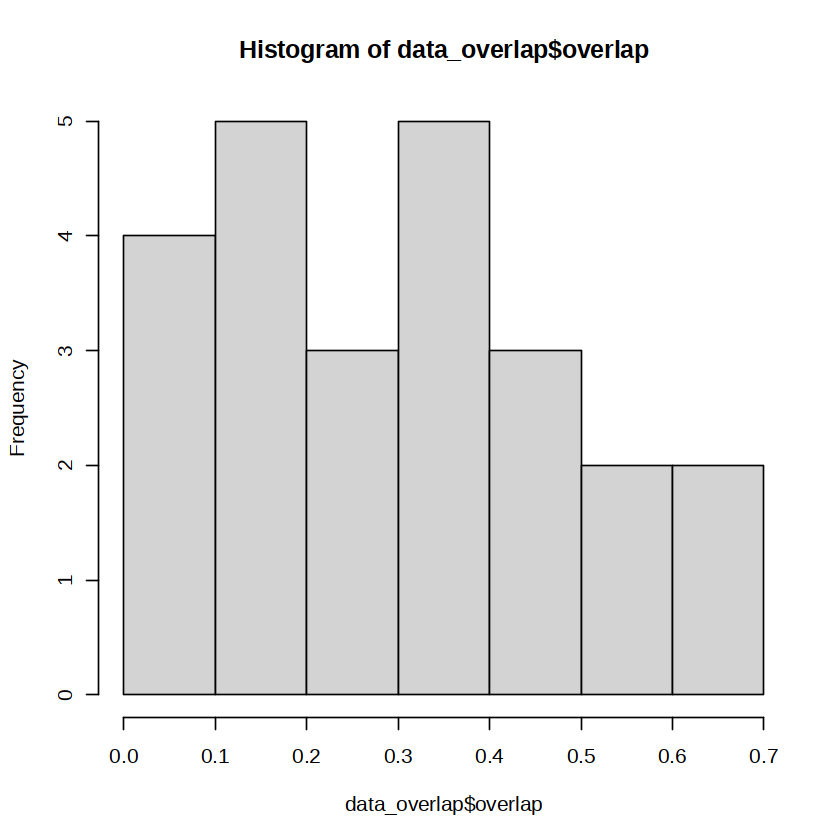

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
continent,5,0.07739603,0.01547921,0.3859072,0.8507484
range,1,0.02969279,0.02969279,0.7402614,0.4031201
var_explained1,1,0.06439675,0.06439675,1.6054549,0.2244518
var_explained2,1,0.01234262,0.01234262,0.3077099,0.5872657
Residuals,15,0.60166827,0.04011122,NA,NA


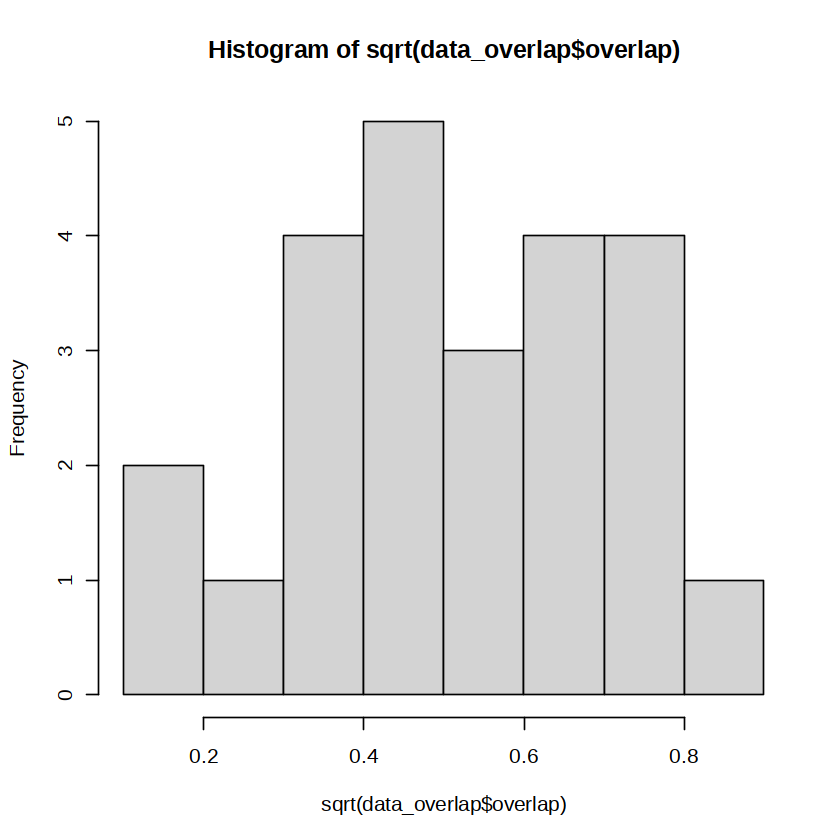

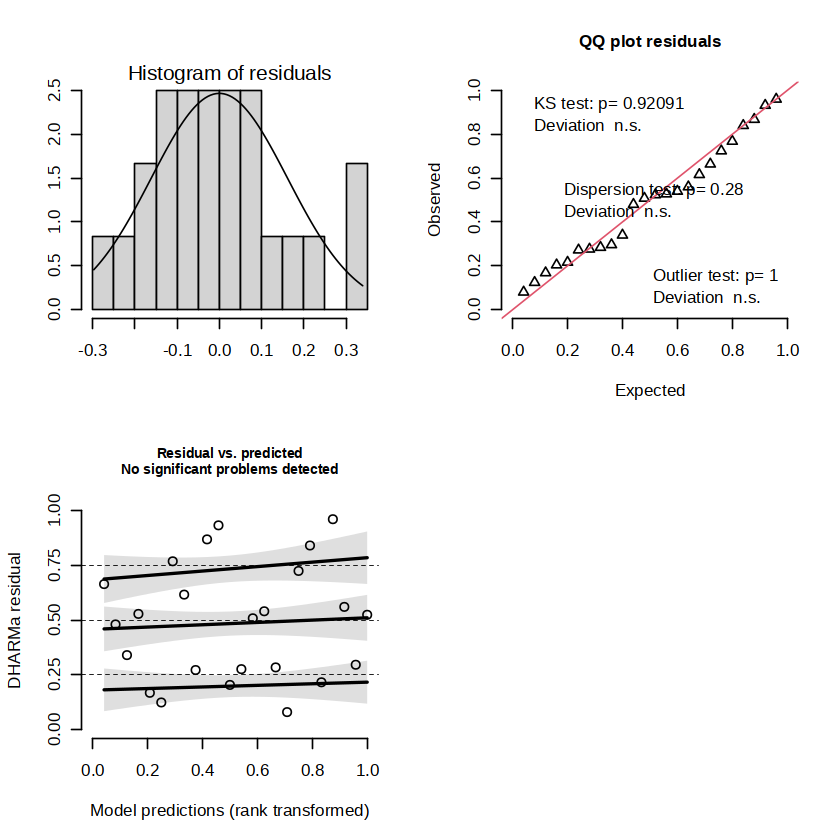

In [55]:
data_overlap<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/tables/pca_ellipse_overlap.csv")
head(data_overlap)

hist(data_overlap$overlap)
hist(sqrt(data_overlap$overlap))


mod_overlap<-lm(overlap ~ continent+range+ var_explained1 + var_explained2 , data=data_overlap, na.action=na.fail)
anova(mod_overlap)
#Does model selection makes any sense here ?
#mod<-dredge(mod_overlap, trace=T, rank="AICc")
#mod
#best_model<-lm(overlap ~  var_explained1 + var_explained2, data=data_overlap)
#anova(best_model)

#check fit
diagnostics.plot.dharma <-function(mod.res, col=grey(level=0.25, alpha=0.5), breaks.histo=20, quantreg=TRUE){
  old.par = par(no.readonly = TRUE)
  par(mfrow=c(2, 2))
  hist(residuals(mod.res), probability=T, xlab="", ylab="", main="", breaks=breaks.histo)
  mtext(text="Histogram of residuals", side=3, line=0)
  x=seq(min(residuals(mod.res)), max(residuals(mod.res)), length.out=100)
  lines(x, dnorm(x, mean=0, sd=sd(residuals(mod.res))))
  simulationOutput <- simulateResiduals(fittedModel = mod.res, plot = FALSE)
  plotQQunif(simulationOutput) # left plot in plot.DHARMa()
  plotResiduals(simulationOutput, quantreg=quantreg)
}
diagnostics.plot.dharma(mod_overlap)
